### GROUP NAME: ISTANBULLS

Anil Egin - 3149068


Eren Karsavuranoğlu - 3164647


Berkay Demirkazık - 3174016


Doruk Efe Kanber - 3163051


Hamza Abdella Kedir - 3178572

# Introduction
The dataset that we are going to investigate is originated from New York City Taxi and Limousine Comission. We focus on a sample of taxi trip transactions from May 2015, concentrating solely on paid trips. By examining this data, we aim to gain a deeper understanding of taxi usage in the city during this period and find potential anomalies in the given dataset.

In [1]:
import sys
import sklearn
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt  #visualisation
import seaborn as sns   #visualisation
%matplotlib inline
sns.set(color_codes=True)

from random import randint
from scipy.stats import kurtosis, skew
import random

pd.set_option("display.max_colwidth", None)
pd.set_option("display.max_columns", None)

random.seed(111)
np.random.seed(111)

C:\Users\anili\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\pandas\core\computation\expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.8.1' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED


In [2]:
raw_data = pd.read_csv("taxi_tidy.csv", engine = 'python', index_col=0)

In [3]:
raw_data.head()

,pickup_hour,pickup_month,pickup_week,pickup_doy,pickup_wday,length_time,pickup_BoroCode,pickup_NTACode,dropoff_BoroCode,dropoff_NTACode,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,vendor_id,passenger_count,trip_distance,fare_amount,pair
1,18,5,19,132,4,520,1,MN15,1,MN19,-73.983009,40.766602,-73.967972,40.760677,1,1,0.90,7.0,MN15-MN19
2,7,5,21,146,4,672,1,MN24,1,MN17,-74.009789,40.712395,-73.983223,40.760330,1,1,3.70,12.5,MN24-MN17
3,18,5,19,127,6,824,1,MN21,1,MN24,-73.989510,40.734470,-73.997185,40.717976,1,1,1.40,10.0,MN21-MN24
4,2,5,22,148,6,637,1,MN17,1,MN33,-73.978989,40.755726,-73.951187,40.789021,1,1,3.40,12.0,MN17-MN33
5,17,5,21,141,6,2491,1,MN17,4,QN98,-73.985313,40.761181,-73.865250,40.770699,2,1,11.74,37.5,MN17-QN98


In [4]:
print("Dataframe dimensions:", np.shape(raw_data))

Dataframe dimensions: (491292, 19)


We have 19 columns and 491292 entries.

In [5]:
raw_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 491292 entries, 1 to 491292
Data columns (total 19 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   pickup_hour        491292 non-null  int64  
 1   pickup_month       491292 non-null  int64  
 2   pickup_week        491292 non-null  int64  
 3   pickup_doy         491292 non-null  int64  
 4   pickup_wday        491292 non-null  int64  
 5   length_time        491292 non-null  int64  
 6   pickup_BoroCode    491292 non-null  int64  
 7   pickup_NTACode     491292 non-null  object 
 8   dropoff_BoroCode   491292 non-null  int64  
 9   dropoff_NTACode    491292 non-null  object 
 10  pickup_longitude   491292 non-null  float64
 11  pickup_latitude    491292 non-null  float64
 12  dropoff_longitude  491292 non-null  float64
 13  dropoff_latitude   491292 non-null  float64
 14  vendor_id          491292 non-null  int64  
 15  passenger_count    491292 non-null  int64  
 16  trip_di

In [6]:
raw_data.isna().sum()

pickup_hour          0
pickup_month         0
pickup_week          0
pickup_doy           0
pickup_wday          0
length_time          0
pickup_BoroCode      0
pickup_NTACode       0
dropoff_BoroCode     0
dropoff_NTACode      0
pickup_longitude     0
pickup_latitude      0
dropoff_longitude    0
dropoff_latitude     0
vendor_id            0
passenger_count      0
trip_distance        0
fare_amount          0
pair                 0
dtype: int64

In [7]:
raw_data.describe()

,pickup_hour,pickup_month,pickup_week,pickup_doy,pickup_wday,length_time,pickup_BoroCode,dropoff_BoroCode,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,vendor_id,passenger_count,trip_distance,fare_amount
count,491292.000000,491292.0,491292.000000,491292.000000,491292.000000,491292.000000,491292.000000,491292.000000,491292.000000,491292.000000,491292.000000,491292.000000,491292.000000,491292.000000,4.912920e+05,491292.000000
mean,13.612855,5.0,19.900013,136.342308,3.916406,985.000853,1.210382,1.274828,-73.973938,40.750535,-73.973544,40.751074,1.526115,1.641301,2.813226e+01,13.450401
std,6.461628,0.0,1.278181,8.667126,1.979211,2694.842046,0.740909,0.790923,0.037660,0.027587,0.033461,0.031820,0.499318,1.293645,1.712510e+04,10.359049
min,0.000000,5.0,18.000000,122.000000,1.000000,0.000000,1.000000,1.000000,-74.104080,40.575272,-74.242378,40.502365,1.000000,0.000000,0.000000e+00,0.010000
25%,9.000000,5.0,19.000000,129.000000,2.000000,434.000000,1.000000,1.000000,-73.992378,40.736317,-73.991577,40.734570,1.000000,1.000000,1.100000e+00,7.000000
50%,14.000000,5.0,20.000000,136.000000,4.000000,716.000000,1.000000,1.000000,-73.981934,40.752998,-73.979866,40.753632,2.000000,1.000000,1.830000e+00,10.000000
75%,19.000000,5.0,21.000000,144.000000,6.000000,1157.000000,1.000000,1.000000,-73.967644,40.768681,-73.963333,40.770138,2.000000,2.000000,3.400000e+00,15.500000
max,23.000000,5.0,22.000000,152.000000,7.000000,86393.000000,5.000000,5.000000,-73.728279,40.901421,-73.701439,40.911293,2.000000,8.000000,1.200000e+07,500.000000


In [8]:
print(raw_data[raw_data["length_time"] == 0].shape[0])
print(raw_data[raw_data["trip_distance"] == 0].shape[0])

10
823


We reviewed the records where the length or duration of the trip equals zero.

In [9]:
raw_data.drop(raw_data[raw_data['length_time'] == 0].index, inplace = True)
raw_data.drop(raw_data[raw_data['trip_distance'] == 0].index, inplace = True)

Since the total data entries where we have 0 trip duration or distance are less than %.50 of the entire set, we found unneccessary to do imputation. Hence we dropped these entries.


In [10]:
raw_data["vendor_id"].nunique()

2

<Axes: xlabel='trip_distance'>

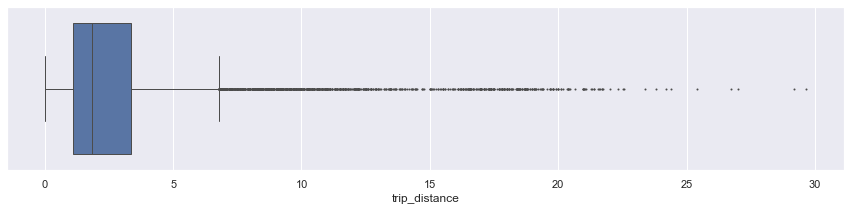

In [11]:
sample_data = raw_data.sample(n=10000)

plt.figure(figsize=(15, 3))
sns.boxplot(data=sample_data, x='trip_distance', fliersize=1)

The boxplot shows that the majority of trip distances are relatively short, with a few longer trips. The distribution is right-skewed.It's bounded by zero on the left and open-ended on the right, and there are typically more short trips than long ones.

Text(0.5, 1.0, 'Trip distance histogram')

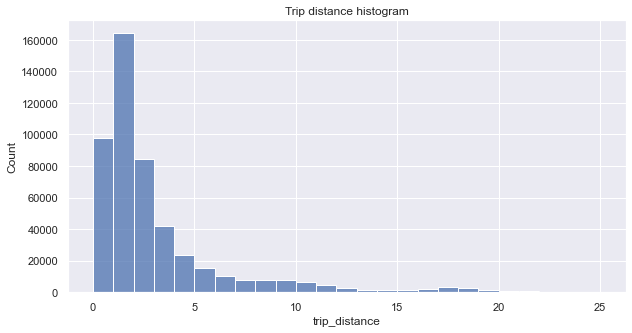

In [12]:
plt.figure(figsize=(10,5))
sns.histplot(raw_data['trip_distance'], bins=range(0,26,1))
plt.title('Trip distance histogram')

The histogram serves as a useful tool for understanding common trip lengths and identifying the rarity of longer trips within the dataset. The majority of trips are short, with a high frequency of very short distances (under 5 miles) and a rapid decline in frequency as the distance increases. This right-skewed distribution indicates that while most trips are short, there are a few longer trips, which are relatively rare.

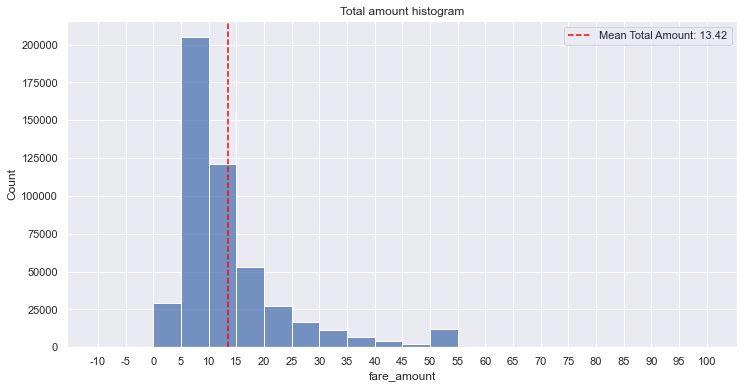

In [13]:
plt.figure(figsize=(12,6))
ax = sns.histplot(raw_data['fare_amount'], bins=range(-10,101,5))
ax.set_xticks(range(-10,101,5))
ax.set_xticklabels(range(-10,101,5))
plt.title('Total amount histogram')

# Calculate mean of total_amount and mean line in red color
mean_total_amount = np.mean(raw_data['fare_amount'])
plt.axvline(x=mean_total_amount, color='red', linestyle='--', label=f'Mean Total Amount: {mean_total_amount:.2f}')
plt.legend()
plt.show()

This histogram displays the distribution of fare amounts for a set of transactions. The total cost of each trip also has a distribution that skews right, with most costs falling in the 5-15 range. The dashed red line represents the mean (average) total amount, which is $13.45. This line is positioned to the right of the mode, which is typical for a right-skewed distribution.

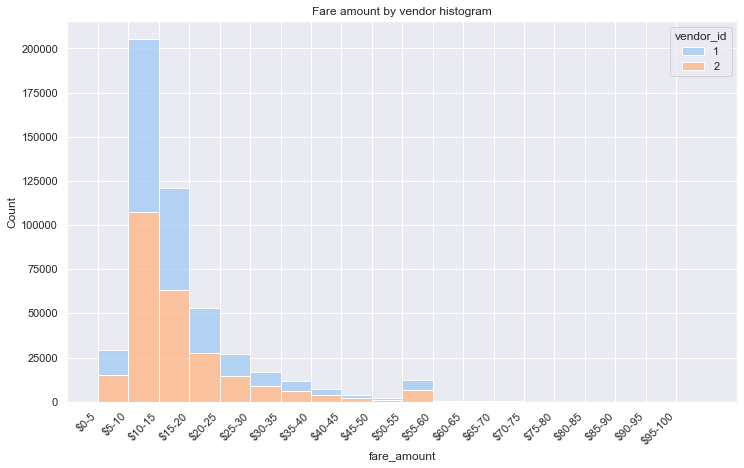

In [14]:
bin_edges = np.arange(0, 101, 5)
bin_labels = [f'${i}-{i+5}' for i in range(0, 100, 5)]

plt.figure(figsize=(12,7))
ax = sns.histplot(data=raw_data, x='fare_amount', bins=bin_edges,
                  hue='vendor_id',
                  multiple='stack',
                  palette='pastel')
ax.set_xticks(bin_edges[:-1])
ax.set_xticklabels(bin_labels, rotation=45, ha='right')
plt.title('Fare amount by vendor histogram')
plt.show()


The histogram shows that both vendors contribute the most in the same price range which is 10-15 dollars. When we break down the fare amounts by vendor, we find no significant differences in how tips are distributed between the two vendors in the dataset.

pickup_wday
Monday       72164
Tuesday      69888
Wednesday    80776
Thursday     66835
Friday       69456
Saturday     67334
Sunday       64007
Name: count, dtype: int64


C:\Users\anili\AppData\Local\Temp\ipykernel_50456\3784753782.py:10: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(day_order)


Text(0.5, 1.0, 'Ride count by day')

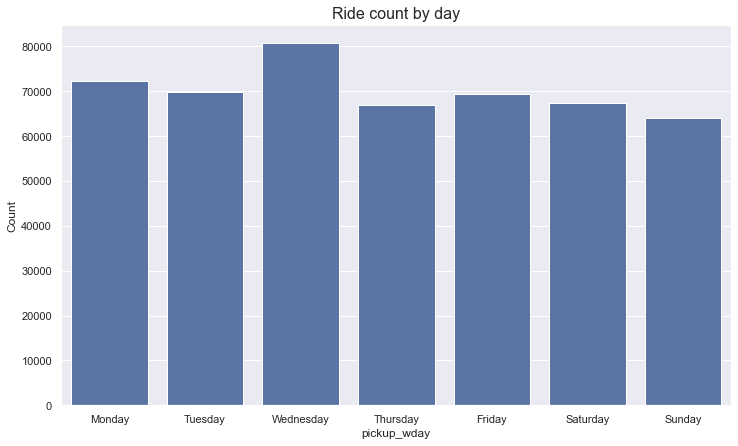

In [15]:
daily_rides = raw_data["pickup_wday"].value_counts().sort_index()
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
day_mapping = {i: day_name for i, day_name in zip(range(1, 8), day_order)}
daily_rides = daily_rides.rename(index=day_mapping)

print(daily_rides)

plt.figure(figsize=(12,7))
ax = sns.barplot(x=daily_rides.index, y=daily_rides)
ax.set_xticklabels(day_order)
ax.set_ylabel('Count')
plt.title('Ride count by day', fontsize=16)


This bar chart  shows the number of rides for each day of the week. The tallest bar occurs on Wednesday, indicating it had the highest ride count, while the lowest is on Sunday. The chart suggests variability in ride demand throughout the week.

pickup_wday
Monday        948682.36
Tuesday       946469.11
Wednesday    1084208.94
Thursday      907272.24
Friday        969315.28
Saturday      919696.84
Sunday        808322.80
Name: fare_amount, dtype: float64


C:\Users\anili\AppData\Local\Temp\ipykernel_50456\1203571715.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(day_order)


Text(0.5, 1.0, 'Revenue by day')

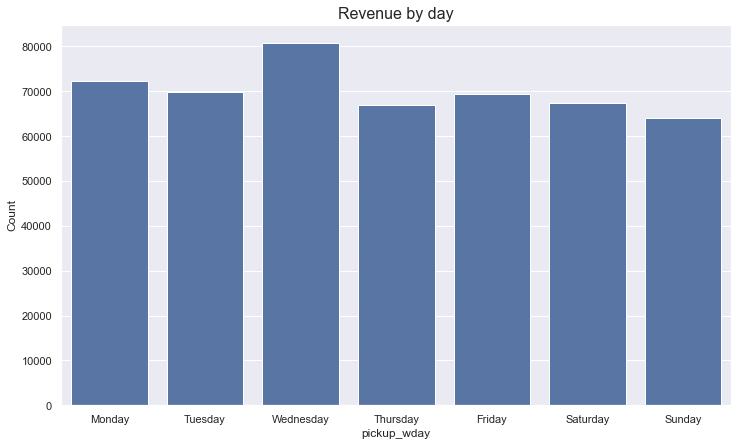

In [16]:
total_amount_day = raw_data.groupby("pickup_wday")['fare_amount'].sum()
total_amount_day = total_amount_day.rename(index=day_mapping)

print(total_amount_day)

plt.figure(figsize=(12,7))
ax = sns.barplot(x=daily_rides.index, y=daily_rides)
ax.set_xticklabels(day_order)
ax.set_ylabel('Count')
plt.title('Revenue by day', fontsize=16)

This bar chart displays the daily revenue generated over the course of a week. Wednesday stands out with the highest revenue, as depicted by the tallest bar, whereas Sunday has the lowest, which corresponds to the number of rides by day.

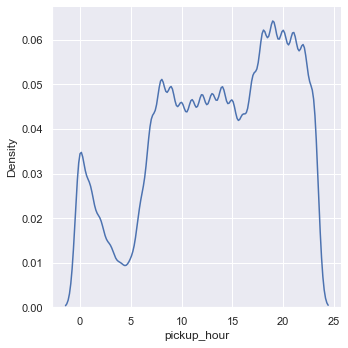

In [17]:
sns.displot(
        raw_data,
        x= "pickup_hour",
        kind="kde"
    )

The density plot shows the distribution of pickup times throughout a 24-hour period. It suggests certain trends. There are periods of low pickup density, which likely correspond to off-peak hours. One such period is around 5 a.m., where the density is lowest, indicating fewer pickups occur at this time. The density peaks at several times, suggesting high demand. Notably, there is a peak just before 9 a.m., which could correspond with the morning rush hour. Another peak occurs in the late evening, around 11 p.m., possibly reflecting evening social activities.

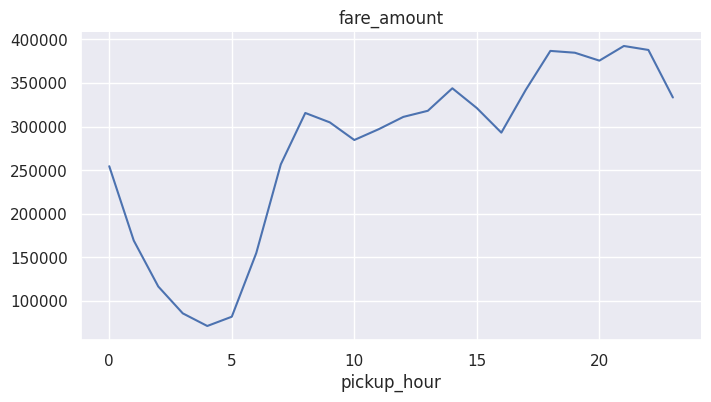

In [ ]:
from matplotlib import pyplot as plt
hourly_revenue = raw_data.groupby('pickup_hour')['fare_amount'].sum()
hourly_revenue.plot(kind='line', figsize=(8, 4), title='fare_amount')
plt.gca().spines[['top', 'right']].set_visible(False)

This graph shows the total fare amount by the 24-hour period. It correlated with the distribution of pickup times throughout a 24-hour period. During the low pick up hours, the total fare amount is less. During the peak hours, the the total fare amount is high.

In [ ]:
# RUN THIS IF YOU GET IMPORT ERROR

!pip install folium
!pip install geopandas

In [ ]:
import geopandas as gpd
import folium
from folium.plugins import MarkerCluster


In [ ]:
pickup_loc = raw_data[["pickup_longitude", "pickup_latitude"]].sample(n=10000)
pickup_loc = pickup_loc.rename(columns={"pickup_longitude": "longitude", "pickup_latitude": "latitude"})
geometry = gpd.points_from_xy(pickup_loc["longitude"], pickup_loc["latitude"])
gdf = gpd.GeoDataFrame(pickup_loc, geometry=geometry)


In [ ]:
center = [40.7128, -74.0059]  # New York City coordinates

m = folium.Map(location=center, zoom_start=12)

In [ ]:
marker_cluster = MarkerCluster()

for index, row in gdf.iterrows():
    marker = folium.Marker(
        [row['latitude'], row['longitude']],
        popup=f"Pickup: {row['pickup_location']}" if 'pickup_location' in row else None
    )
    marker_cluster.add_child(marker)
m.add_children(marker_cluster)

<ipython-input-246-36c8579cc816>:9: FutureWarning: Method `add_children` is deprecated. Please use `add_child` instead.
  m.add_children(marker_cluster)


We have generated a map of New York that illustrates the distribution of taxi pick-ups across different areas. It's evident that the surrounding of Manhattan and Central Park areas experience a higher volume of taxi activity, which aligns with expectations given these areas prominence and popularity. This visualization effectively highlights the areas with the highest concentration of taxi usage, offering valuable insights into the city's taxi usage patterns.

In [ ]:
# above $50 rides
raw_data_filter = raw_data[raw_data["fare_amount"]>50]
count_above_50 = raw_data_filter.shape[0]
print("Count of above $50 rides: {}".format(count_above_50))
pickup_loc = raw_data_filter[["pickup_longitude", "pickup_latitude"]].sample(n=10000)
pickup_loc = pickup_loc.rename(columns={"pickup_longitude": "longitude", "pickup_latitude": "latitude"})
geometry = gpd.points_from_xy(pickup_loc["longitude"], pickup_loc["latitude"])
gdf = gpd.GeoDataFrame(pickup_loc, geometry=geometry)

marker_cluster = MarkerCluster()

for index, row in gdf.iterrows():
    marker = folium.Marker(
        [row['latitude'], row['longitude']],
        popup=f"Pickup: {row['pickup_location']}" if 'pickup_location' in row else None
    )
    marker_cluster.add_child(marker)
m.add_children(marker_cluster)


Count of above $50 rides: 13129


<ipython-input-247-698fb5567673>:18: FutureWarning: Method `add_children` is deprecated. Please use `add_child` instead.
  m.add_children(marker_cluster)


To deepen our analysis, we investigated the frequency of pick-ups with fares exceeding 50 euros. Anticipating a correlation with airport-related travel, we found that nearly half of such high-fare rides originated from John F. Kennedy International Airport, confirming our hypothesis. Also, locations closer to the airport yielded fewer rides above the 50-dollar threshold. In contrast, areas more distant from the airport, particularly around Manhattan, accounted for a larger share of these higher-fare rides. This pattern is consistent with our expectations and offers valuable insights into the pricing dynamics and pick-up area frequency characteristics of our dataset.

### OUTLIER DETECTION

It is indicated that fare amount of each trip is calculated using time-distance by the meter. So that we are going to eliminate the trips which might have potential taxi meter errors resulting in high distance - low fare trips or long duration - low fare. By domain knowledge we know that NYC taxi commission charges $3.50 for each mile in addition to other charges in 2024, however, we still don't know the fare formula used back in 2015. Therefore we are going to examine the ratios between distance-fare and time-fare and try to find approximate linear relation between time-distance-fare while taking into consideration the noise which can be extra charges, initial charge, airport charge, etc.

In [ ]:
print(raw_data["fare_amount"].describe())
print("Fare Amount Above $3: ", raw_data[raw_data["fare_amount"]>3].shape[0])
print("Below $3: ", raw_data[raw_data["fare_amount"]<=3].shape[0])
print("Below $4: ", raw_data[raw_data["fare_amount"]<=4].shape[0])

count    490460.000000
mean         13.424066
std          10.259287
min           0.010000
25%           7.000000
50%          10.000000
75%          15.500000
max         161.000000
Name: fare_amount, dtype: float64
Fare Amount Above $3:  489292
Below $3:  1168
Below $4:  15059


We see a rapid increase when we compare trips with total fare less than 3 and 4. We can deduce that initial charge is at least around 3. So most likely the entries which has 3 or less fare amount have not-normal situations and very few observations. So we delete them.

In [13]:
raw_data = raw_data[raw_data["fare_amount"]>3]

Correlation coefficient: 0.0012309666716974377


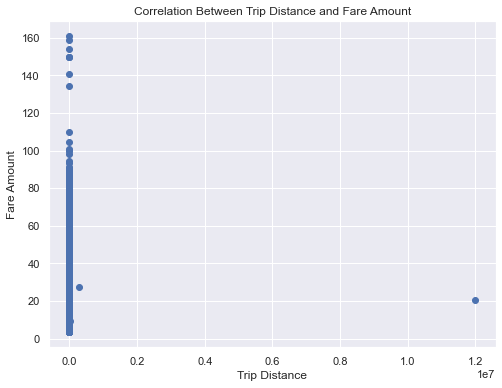

In [14]:
correlation = raw_data['trip_distance'].corr(raw_data['fare_amount'])
print("Correlation coefficient:", correlation)

# Create scatter plot
plt.figure(figsize=(8, 6))  # Adjust figure size as needed
plt.scatter(raw_data['trip_distance'], raw_data['fare_amount'])
plt.xlabel('Trip Distance')
plt.ylabel('Fare Amount')
plt.title('Correlation Between Trip Distance and Fare Amount')
plt.grid(True)

# Add optional elements like trendline or annotations
# plt.plot(data['trip_distance'], trendline(data['trip_distance'], data['fare_amount']), color='red')  # Example trendline

plt.show()

This correlation coefficient is unlikely to be true. We know that one of the main components of fare calculator is distance so we should find high correlativity.

In [15]:
raw_data["ratio_dist"] = raw_data["fare_amount"] / raw_data["trip_distance"]
raw_data["ratio_dist"].describe()

count    489292.000000
mean          5.935582
std          23.397914
min           0.000002
25%           4.136029
50%           5.263158
75%           6.666667
max        7500.000000
Name: ratio_dist, dtype: float64

In [16]:
print("Ratio Above 2.75: ", raw_data[raw_data["ratio_dist"]>2.75].shape[0])
print("Ratio Below 2.75: ", raw_data[raw_data["ratio_dist"]<=2.75].shape[0])
print("Ratio Below 3: ", raw_data[raw_data["ratio_dist"]<=3].shape[0])

Ratio Above 2.75:  484722
Ratio Below 2.75:  4570
Ratio Below 3:  19781


We see that most of the trips has 3-1 ratio between distance and fare. We can deduce that NYC commission most likely charges around $2.75 per mile. Therefore we are going to delete the trips which has ratio less than 2.75

In [17]:
raw_data = raw_data[raw_data["ratio_dist"]>2.75]

Correlation coefficient: 0.9558041093830826


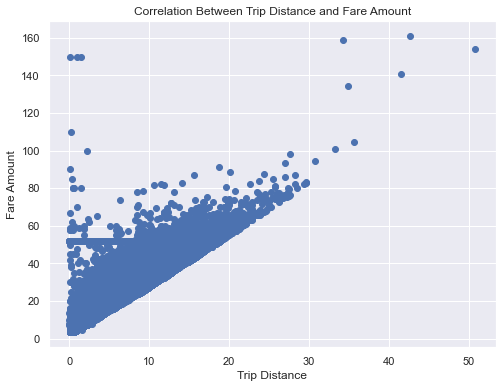

In [18]:
correlation = raw_data['trip_distance'].corr(raw_data['fare_amount'])
print("Correlation coefficient:", correlation)

# Create scatter plot
plt.figure(figsize=(8, 6))  # Adjust figure size as needed
plt.scatter(raw_data['trip_distance'], raw_data['fare_amount'])
plt.xlabel('Trip Distance')
plt.ylabel('Fare Amount')
plt.title('Correlation Between Trip Distance and Fare Amount')
plt.grid(True)

# Add optional elements like trendline or annotations
# plt.plot(data['trip_distance'], trendline(data['trip_distance'], data['fare_amount']), color='red')  # Example trendline

plt.show()

Now, we are able to see clear structure and correlation. The vertical line close to 0 represents very short trips in which the fare is mostly initial charge.

Correlation coefficient: 0.2298148903536679


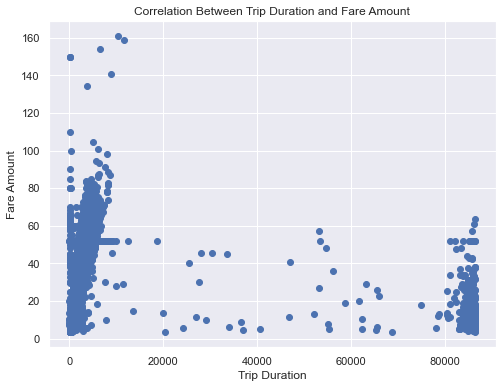

In [19]:
correlation = raw_data['length_time'].corr(raw_data['fare_amount'])
print("Correlation coefficient:", correlation)

# Create scatter plot
plt.figure(figsize=(8, 6))  # Adjust figure size as needed
plt.scatter(raw_data['length_time'], raw_data['fare_amount'])
plt.xlabel('Trip Duration')
plt.ylabel('Fare Amount')
plt.title('Correlation Between Trip Duration and Fare Amount')
plt.grid(True)

# Add optional elements like trendline or annotations
# plt.plot(data['trip_distance'], trendline(data['trip_distance'], data['fare_amount']), color='red')  # Example trendline

plt.show()

In [20]:
raw_data["ratio_time"] = raw_data["fare_amount"] / raw_data["length_time"]
raw_data["ratio_time"].describe()

count    484722.000000
mean          0.017463
std           0.129721
min           0.000041
25%           0.012855
50%           0.014943
75%           0.017857
max          50.000000
Name: ratio_time, dtype: float64

In [21]:
print("Ratio Above 0.035: ", raw_data[raw_data["ratio_time"]>0.035].shape[0])
print("Ratio Below 0.035: ", raw_data[raw_data["ratio_time"]<=0.035].shape[0])

Ratio Above 0.035:  2898
Ratio Below 0.035:  481824


In [22]:
raw_data = raw_data[raw_data["ratio_time"]<=0.035]

Now, we removed the outliers which might lead to potential inaccuracies when we build the model. As a final step we will drop some columns which are unuseful or does not give information we can depend on. We will drop pickup_NTACode and dropoff_NTACode as we can regenerate those column using pair column in anytime. We will also drop passenger_count since the way the data is recorded is not countable. The data is human-entered, very prone to errors and not related to fare-distance-time.

In [260]:
final_data = raw_data[['pickup_hour', 'pickup_month', 'pickup_week', 'pickup_doy',
       'pickup_wday', 'length_time', 'pickup_BoroCode','dropoff_BoroCode',
       'pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude',
       'vendor_id', 'trip_distance', 'fare_amount', 'pair']]

In [23]:
final_data = raw_data

In [24]:
final_data.head()

,pickup_hour,pickup_month,pickup_week,pickup_doy,pickup_wday,length_time,pickup_BoroCode,pickup_NTACode,dropoff_BoroCode,dropoff_NTACode,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,vendor_id,passenger_count,trip_distance,fare_amount,pair,ratio_dist,ratio_time
1,18,5,19,132,4,520,1,MN15,1,MN19,-73.983009,40.766602,-73.967972,40.760677,1,1,0.90,7.0,MN15-MN19,7.777778,0.013462
2,7,5,21,146,4,672,1,MN24,1,MN17,-74.009789,40.712395,-73.983223,40.760330,1,1,3.70,12.5,MN24-MN17,3.378378,0.018601
3,18,5,19,127,6,824,1,MN21,1,MN24,-73.989510,40.734470,-73.997185,40.717976,1,1,1.40,10.0,MN21-MN24,7.142857,0.012136
4,2,5,22,148,6,637,1,MN17,1,MN33,-73.978989,40.755726,-73.951187,40.789021,1,1,3.40,12.0,MN17-MN33,3.529412,0.018838
5,17,5,21,141,6,2491,1,MN17,4,QN98,-73.985313,40.761181,-73.865250,40.770699,2,1,11.74,37.5,MN17-QN98,3.194208,0.015054


In [25]:
final_data.shape

(481824, 21)

In [26]:
filename = "tidy_dataset_istanbulls_data.csv"

final_data.to_csv(filename, index=False)

print("Final data saved to CSV file:", filename)

Final data saved to CSV file: tidy_dataset_istanbulls_data.csv
